# EDA, Text, Processing, and Feature Engineering

In [1]:
# custom functions for this project
from functions import *

# dataframe libraries
import pandas as pd
import numpy as np

# graphing libraries
import matplotlib.pyplot as plt
import seaborn as sns; sns.set_style('ticks')
from wordcloud import WordCloud

# text processing
import nltk
from nltk import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer 
from textblob import TextBlob as tb
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim import matutils, models
import scipy.sparse
import pronouncing

# miscellany
import re
import string
from collections import Counter
import time
import gzip
import pickle

# reload functions/libraries when edited
%load_ext autoreload
%autoreload 2

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# increase column width of dataframe
pd.set_option('max_colwidth', 150)

### Load in DataFrame

In [2]:
df = pd.read_csv('/Users/p.szymo/Documents/flatiron/projects/mod5/poetry_genre_classifier/data/poetry_foundation_raw_rescrape.csv', index_col=0)
df.head()

,poet_url,genre,poem_url,poet,title,poem_lines,poem_string
0,https://www.poetryfoundation.org/poets/richard-brautigan,beat,https://www.poetryfoundation.org/poems/48578/at-the-california-institute-of-technology,Richard Brautigan,At the California Institute of Technology,"['I don’t care how God-damn smart', '\r these guys are: I’m bored.', '', '\r It’s been raining like hell all day long', '\r and there’s nothing to...",I don’t care how God-damn smart\n\r these guys are: I’m bored.\n\n\r It’s been raining like hell all day long\n\r and there’s nothing to do.\n
1,https://www.poetryfoundation.org/poets/richard-brautigan,beat,https://www.poetryfoundation.org/poems/48576/a-boat,Richard Brautigan,A Boat,"['O beautiful ', 'was the werewolf ', 'in his evil forest. ', 'We took him ', 'to the carnival ', 'and he started ', ' crying ', 'when h...",O beautiful \nwas the werewolf \nin his evil forest. \nWe took him \nto the carnival \nand he started \n crying \nwhen he saw \nthe Ferr...
2,https://www.poetryfoundation.org/poets/richard-brautigan,beat,https://www.poetryfoundation.org/poems/48580/december-30,Richard Brautigan,December 30,"['At 1:03 in the morning a fart', '\r smells like a marriage between', '\r an avocado and a fish head.', '', '\r I have to get out of bed', '\r to...",At 1:03 in the morning a fart\n\r smells like a marriage between\n\r an avocado and a fish head.\n\n\r I have to get out of bed\n\r to write this ...
3,https://www.poetryfoundation.org/poets/richard-brautigan,beat,https://www.poetryfoundation.org/poems/48579/the-double-bed-dream-gallows,Richard Brautigan,The Double-Bed Dream Gallows,"['Driving through ', '\r hot brushy country', '\r in the late autumn, ', '\r I saw a hawk', '\r crucified on a', '\r barbed-wire fence.', '', ...","Driving through \n\r hot brushy country\n\r in the late autumn, \n\r I saw a hawk\n\r crucified on a\n\r barbed-wire fence.\n\n\r I guess as a..."
4,https://www.poetryfoundation.org/poets/richard-brautigan,beat,https://www.poetryfoundation.org/poems/48581/haiku-ambulance,Richard Brautigan,Haiku Ambulance,"['A piece of green pepper', '\r fell', '\r off the wooden salad bowl:', '\r so what?', '']",A piece of green pepper\n\r fell\n\r off the wooden salad bowl:\n\r so what?\n


In [3]:
df.shape

(4626, 7)

#### Saving to CSV converts the poem_lines lists into a string, so we'll use our destringify function to convert it back to a list format.

In [4]:
df.loc[2,'poem_lines']

"['At 1:03 in the morning a fart', '\\r smells like a marriage between', '\\r an avocado and a fish head.', '', '\\r I have to get out of bed', '\\r to write this down without', '\\r    my glasses on.', '']"

In [5]:
df['poem_lines'] = df['poem_lines'].apply(destringify)
df.loc[2,'poem_lines']

['At 1:03 in the morning a fart',
 '\r smells like a marriage between',
 '\r an avocado and a fish head.',
 '',
 '\r I have to get out of bed',
 '\r to write this down without',
 '\r    my glasses on.',
 '']

#### Let's look at our class imbalance.

In [6]:
# number of poems per genre
df.genre.value_counts()

modern                            1279
victorian                          643
romantic                           398
imagist                            356
new_york_school                    264
black_mountain                     257
new_york_school_2nd_generation     192
language_poetry                    192
confessional                       176
black_arts_movement                165
georgian                           160
objectivist                        159
harlem_renaissance                 148
beat                               147
fugitive                            90
Name: genre, dtype: int64

In [7]:
# percentage of total poems by genre
df.genre.value_counts(normalize=True)

modern                            0.276481
victorian                         0.138997
romantic                          0.086035
imagist                           0.076956
new_york_school                   0.057069
black_mountain                    0.055556
new_york_school_2nd_generation    0.041505
language_poetry                   0.041505
confessional                      0.038046
black_arts_movement               0.035668
georgian                          0.034587
objectivist                       0.034371
harlem_renaissance                0.031993
beat                              0.031777
fugitive                          0.019455
Name: genre, dtype: float64

In [8]:
# cumulative percentage of total poems by genre
df.genre.value_counts(normalize=True).cumsum()

modern                            0.276481
victorian                         0.415478
romantic                          0.501513
imagist                           0.578470
new_york_school                   0.635538
black_mountain                    0.691094
new_york_school_2nd_generation    0.732598
language_poetry                   0.774103
confessional                      0.812149
black_arts_movement               0.847817
georgian                          0.882404
objectivist                       0.916775
harlem_renaissance                0.948768
beat                              0.980545
fugitive                          1.000000
Name: genre, dtype: float64

In [9]:
# number of unique poets per genre
{genre:len(poets) for genre,poets in df.groupby('genre').poet.unique().items()}

{'beat': 13,
 'black_arts_movement': 18,
 'black_mountain': 10,
 'confessional': 9,
 'fugitive': 7,
 'georgian': 18,
 'harlem_renaissance': 14,
 'imagist': 7,
 'language_poetry': 14,
 'modern': 54,
 'new_york_school': 11,
 'new_york_school_2nd_generation': 16,
 'objectivist': 6,
 'romantic': 50,
 'victorian': 56}

## EDA/Feature Engineering
### Number of lines column -- first clean up the lines, then count them

In [10]:
# see what the lines look like before cleaning
df.loc[2,'poem_lines']

['At 1:03 in the morning a fart',
 '\r smells like a marriage between',
 '\r an avocado and a fish head.',
 '',
 '\r I have to get out of bed',
 '\r to write this down without',
 '\r    my glasses on.',
 '']

In [11]:
# create column using custom function
df['clean_lines'] = df.poem_lines.apply(line_cleaner)

In [12]:
# check our work
df.loc[2,'clean_lines']

['At 1:03 in the morning a fart',
 'smells like a marriage between',
 'an avocado and a fish head.',
 'I have to get out of bed',
 'to write this down without',
 'my glasses on.']

In [13]:
# create number of lines column
df['num_lines'] = df.clean_lines.apply(lambda x: len(x))

In [14]:
# check our work
df.loc[0,'num_lines']

4

In [15]:
# number of lines stats as a whole
df.num_lines.describe()

count    4626.000000
mean       34.931907
std        57.182007
min         1.000000
25%        14.000000
50%        21.000000
75%        31.000000
max       892.000000
Name: num_lines, dtype: float64

In [16]:
# number of lines stats by genre
df.groupby('genre').num_lines.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,41.959184,41.484848,29.354086,39.056818,26.844444,23.775000,23.952703,23.196629,35.234375,23.663018,31.526515,37.484375,37.710692,54.814070,55.643857
std,52.968571,33.016183,30.287604,54.629633,36.237950,18.331658,31.016198,27.738631,45.406163,33.821979,31.505797,45.874285,49.902227,97.717171,94.804401
min,4.000000,1.000000,3.000000,4.000000,5.000000,2.000000,1.000000,2.000000,1.000000,1.000000,2.000000,1.000000,5.000000,4.000000,4.000000
25%,17.500000,21.000000,16.000000,18.000000,14.000000,13.750000,12.000000,11.000000,18.000000,12.500000,19.000000,14.750000,15.000000,14.000000,15.000000
50%,25.000000,30.000000,23.000000,24.500000,21.000000,19.000000,16.000000,18.000000,23.500000,18.000000,25.000000,23.000000,22.000000,24.000000,24.000000
75%,39.500000,54.000000,29.000000,36.500000,26.000000,26.000000,24.000000,24.000000,35.250000,24.000000,32.250000,35.000000,30.500000,48.750000,52.000000
max,326.000000,157.000000,252.000000,456.000000,322.000000,143.000000,239.000000,255.000000,476.000000,605.000000,383.000000,289.000000,375.000000,727.000000,892.000000


### Number of lines -- Boxplot

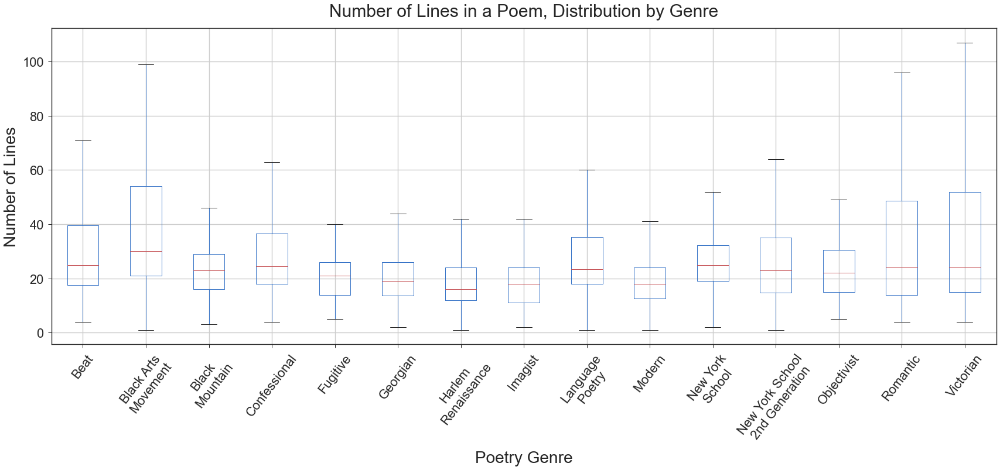

In [17]:
# set a style
sns.set_style('ticks')

# plot the graph
df.boxplot('num_lines', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Number of Lines in a Poem, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Number of Lines', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Some promise here, though the medians look fairly similar
### Number of words column

In [18]:
# create column using custom word counting function
df['num_words'] = df.clean_lines.apply(word_counter)

In [19]:
# number of words stats as a whole
df.num_words.describe()

count    4626.000000
mean      229.970817
std       427.390008
min         2.000000
25%        83.000000
50%       124.000000
75%       208.750000
max      7405.000000
Name: num_words, dtype: float64

In [20]:
# number of words stats by genre
df.groupby('genre').num_words.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,322.836735,250.587879,148.046693,264.869318,199.611111,163.337500,143.506757,133.926966,188.692708,149.672400,244.768939,249.963542,183.893082,380.306533,398.891135
std,692.440275,214.184044,181.405638,430.651705,285.353504,148.223649,192.224447,181.918633,234.640427,212.247054,349.507078,326.468513,263.938226,705.400643,710.966746
min,13.000000,20.000000,8.000000,25.000000,29.000000,11.000000,5.000000,6.000000,11.000000,4.000000,31.000000,2.000000,15.000000,18.000000,19.000000
25%,95.500000,117.000000,64.000000,111.000000,110.500000,89.000000,61.750000,52.000000,64.000000,73.000000,124.000000,86.750000,64.000000,104.000000,110.500000
50%,155.000000,181.000000,99.000000,156.000000,154.000000,118.000000,102.500000,89.500000,106.000000,111.000000,170.500000,143.500000,95.000000,151.000000,171.000000
75%,296.000000,322.000000,149.000000,245.750000,188.000000,180.750000,140.000000,132.000000,229.000000,158.000000,239.250000,264.500000,198.000000,327.500000,359.500000
max,6997.000000,1409.000000,1531.000000,3693.000000,2560.000000,1289.000000,1534.000000,1685.000000,2264.000000,3888.000000,4560.000000,2410.000000,2133.000000,5446.000000,7405.000000


### Word count -- Boxplot

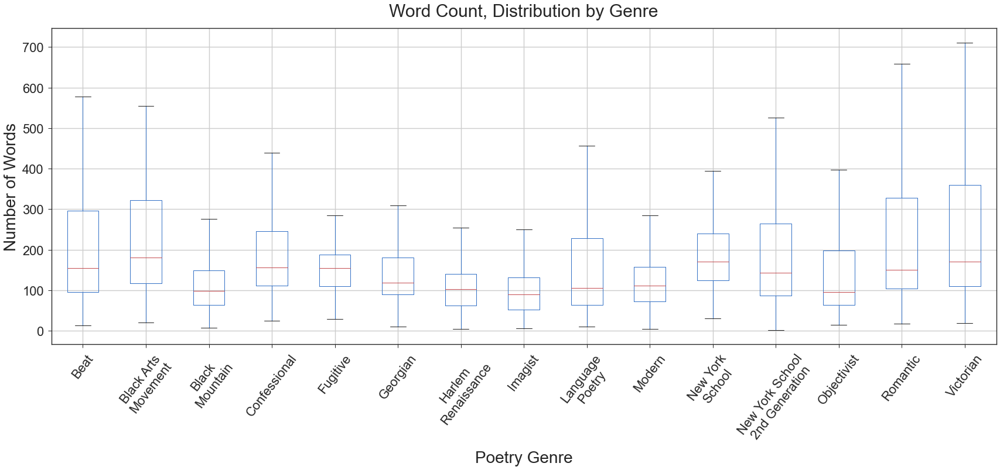

In [21]:
# plot the graph
df.boxplot('num_words', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Word Count, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Number of Words', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Similar spread of information to number of lines, but a little more variable

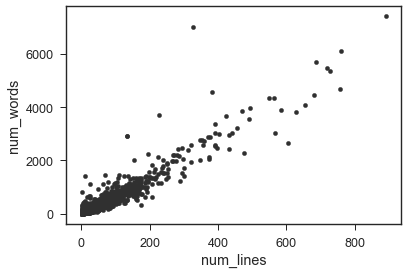

In [22]:
df.plot.scatter('num_lines', 'num_words')

In [23]:
# check correlation
df.num_lines.corr(df.num_words)

0.9464141349707942

#### Indeed they are rather correlated
### Let's create a column with average line length

In [24]:
# create column of average number of words per line
df['avg_len_line'] = df.num_words / df.num_lines

#### Let's look at our new continuous variables, as a whole and by genre

In [25]:
# average length of line stats as a whole
df.avg_len_line.describe()

count    4626.000000
mean        6.799174
std        13.287191
min         1.000000
25%         5.038544
50%         6.241622
75%         7.463599
max       808.000000
Name: avg_len_line, dtype: float64

In [26]:
# average length of line stats by genre
df.groupby('genre').avg_len_line.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,6.806375,6.730992,5.108280,6.542669,7.390701,6.709957,6.255550,6.109058,6.997866,6.644311,7.660061,10.993242,4.704470,6.839576,7.143548
std,4.524520,6.935760,6.165907,1.447545,1.187461,1.413506,3.548687,7.172807,17.950166,5.948366,4.206513,58.555487,1.730617,1.219787,1.874858
min,1.307692,2.840000,1.571429,2.888889,4.148148,3.666667,1.801136,1.444444,1.000000,1.333333,2.523810,1.000000,1.578947,3.600000,3.375000
25%,4.749020,4.710145,3.625000,5.643750,6.743750,5.666667,4.657895,4.000000,3.210714,5.187500,5.939216,4.444639,3.437352,5.955492,6.000000
50%,5.666667,5.794118,4.586207,6.387336,7.463294,6.569712,5.781746,5.233108,4.425725,6.250000,7.148352,6.242647,4.368421,6.842040,6.812500
75%,7.234950,7.285714,5.633333,7.392816,8.077110,7.760476,7.342193,6.376488,7.326577,7.333333,8.183333,7.929762,5.924396,7.665698,8.008000
max,32.181818,88.000000,100.500000,16.340708,11.250000,13.500000,33.800000,105.666667,235.000000,139.000000,42.500000,808.000000,8.920000,11.791667,22.500000


### Average Line Length -- Boxplot

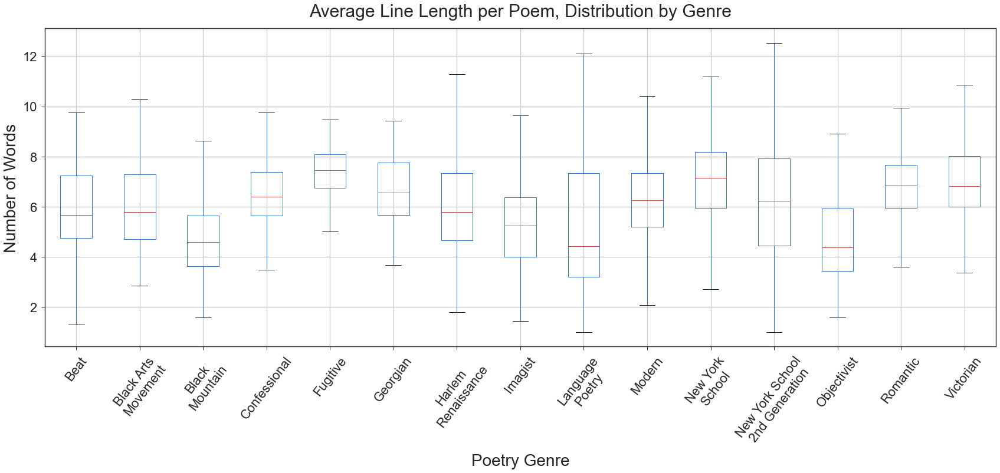

In [27]:
# plot the graph
df.boxplot('avg_len_line', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Average Line Length per Poem, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Number of Words', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Definitely some promise here -- average line length appears to be very telling -- Romantic, Victorian, NY School, and Fugitive have the longest lines on average. Black Mountain, Language Poetry, and Objectivist have the shortest on average.
## A look at polarity by genre

In [28]:
# instantiate VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# create a column with the compound polarity score, passing in the raw poem
df['sentiment_polarity_score'] = df['poem_string'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

In [29]:
# may be handy to also have this as a categorical variable
conditions = [
    df.sentiment_polarity_score >= .05,
    df.sentiment_polarity_score <= -.05
]

choices = [
    'positive',
    'negative'
]

df['sentiment_polarity'] = np.select(conditions, choices, 'neutral')

In [30]:
# polarity score stats as a whole
df.sentiment_polarity_score.describe()

count    4626.000000
mean        0.261469
std         0.731538
min        -0.999900
25%        -0.493900
50%         0.583050
75%         0.929825
max         1.000000
Name: sentiment_polarity_score, dtype: float64

In [31]:
# polarity score stats by genre
df.groupby('genre').sentiment_polarity_score.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,0.211505,0.019956,0.298936,0.082119,0.121377,0.038297,0.143196,0.269458,0.157053,0.211510,0.442634,0.367180,0.152358,0.511530,0.363730
std,0.751574,0.822611,0.640693,0.794445,0.753841,0.789306,0.750819,0.658530,0.654778,0.707653,0.661167,0.681735,0.694334,0.717514,0.785391
min,-0.999800,-0.999400,-0.998200,-0.997000,-0.996200,-0.998000,-0.998700,-0.997900,-0.996500,-0.998100,-0.985900,-0.998600,-0.992100,-0.999700,-0.999900
25%,-0.613250,-0.896800,-0.140600,-0.802525,-0.657175,-0.834350,-0.614775,-0.296000,-0.476700,-0.508550,-0.129600,-0.042200,-0.530850,0.254200,-0.517650
50%,0.434400,0.177900,0.510600,0.326200,0.318700,0.000000,0.327550,0.496100,0.279800,0.461200,0.797000,0.670500,0.273200,0.938800,0.868900
75%,0.925700,0.859100,0.864600,0.895650,0.888500,0.921150,0.880425,0.865650,0.789800,0.880950,0.952300,0.940300,0.818850,0.987700,0.980650
max,0.997600,0.998200,0.996300,0.999900,0.999600,0.998100,0.995900,0.997900,0.996100,0.999900,0.999700,0.999500,0.998100,1.000000,1.000000


### Polarity score -- Boxplot

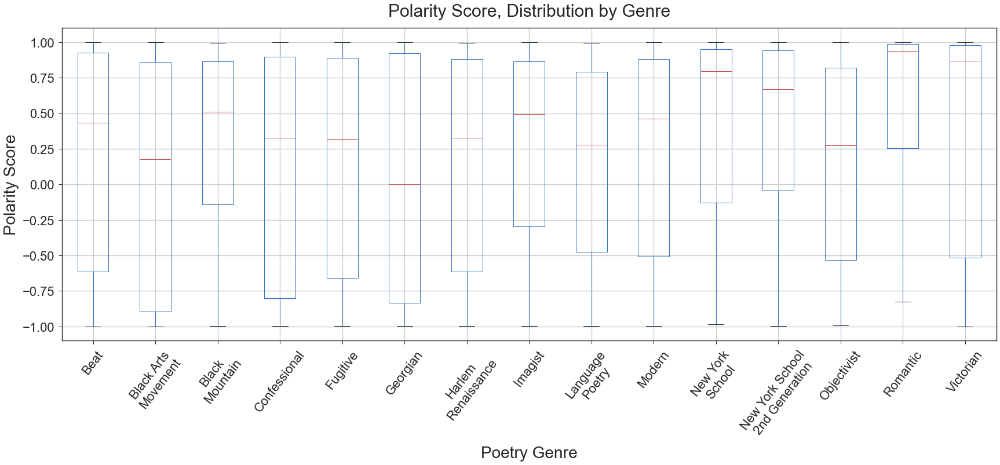

In [32]:
# plot the graph
df.boxplot('sentiment_polarity_score', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Polarity Score, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Polarity Score', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Definitely some telling differences in polarity here

### Polarity -- Stacked bar chart

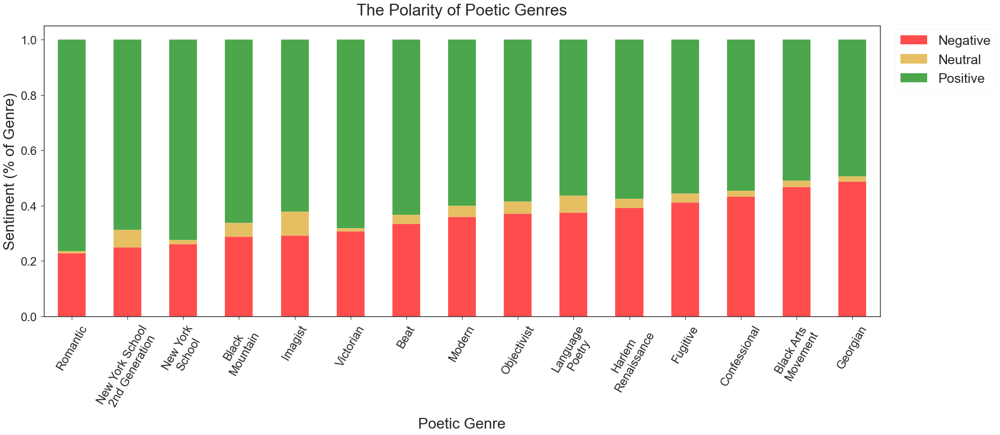

In [33]:
# Proportion of polarity across genre
genre_polarity_dist = df.groupby('genre').sentiment_polarity.value_counts(normalize=True).unstack().sort_values('negative')

# plot the graph
genre_polarity_dist.plot(kind='bar', stacked = True, figsize=(28,10), 
                               color = ['red', 'goldenrod', 'green'], alpha = .70, fontsize=14)

# prettify the graph
plt.title('The Polarity of Poetic Genres', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetic Genre', fontsize=28, labelpad=10)
plt.ylabel('Sentiment (% of Genre)', fontsize=28, labelpad=5)

# obtain x-tick-labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[-2] = 'Black Arts\nMovement'
labels_pretty[2] = 'New York\nSchool'
labels_pretty[1] = 'New York School\n2nd Generation'

plt.xticks(ticks=locs, labels=labels_pretty, rotation=60, fontsize=22)

plt.yticks(fontsize=22);

plt.legend(['Negative', 'Neutral', 'Positive'], facecolor='white', framealpha=1, bbox_to_anchor=(1.01, 1.01),
          fontsize=25);

#### Polarity differences made even more clear here

### A look at subjectivity by genre

In [34]:
# create a column with the compound polarity score, passing in the raw poem to TextBlob
df['sentiment_subjectivity_score'] = df['poem_string'].apply(lambda x: tb(x).sentiment.subjectivity)

# subjectivity score stats as a whole
df.sentiment_subjectivity_score.describe()

count    4626.000000
mean        0.476474
std         0.141628
min         0.000000
25%         0.405556
50%         0.484001
75%         0.552169
max         1.000000
Name: sentiment_subjectivity_score, dtype: float64

In [35]:
# subjectivity score stastby genre
df.groupby('genre').sentiment_subjectivity_score.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,0.485920,0.486905,0.473442,0.449826,0.452348,0.493294,0.461606,0.464208,0.452016,0.472870,0.478922,0.443955,0.467951,0.516769,0.489887
std,0.135374,0.129872,0.134837,0.095791,0.113385,0.135854,0.167038,0.178107,0.159750,0.155394,0.109665,0.161278,0.160679,0.111608,0.106527
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.408879,0.405116,0.393194,0.396533,0.390881,0.421864,0.372917,0.378507,0.386667,0.393127,0.414705,0.396785,0.373066,0.462876,0.433333
50%,0.500000,0.495718,0.467163,0.455133,0.452803,0.493211,0.477050,0.466237,0.456692,0.483929,0.472457,0.465885,0.481250,0.517955,0.500000
75%,0.569556,0.548506,0.558163,0.516742,0.531264,0.568246,0.553571,0.567130,0.543769,0.558333,0.545418,0.526549,0.550000,0.569783,0.542774
max,1.000000,1.000000,1.000000,0.788889,0.683333,1.000000,0.888889,0.933333,1.000000,1.000000,1.000000,0.900000,1.000000,0.950000,0.944444


### Subjectivity score -- Boxplot

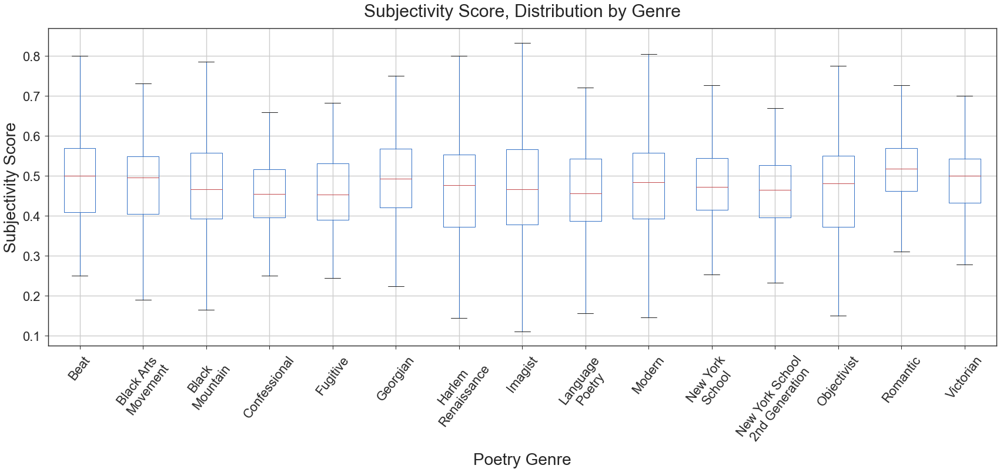

In [36]:
# plot the graph
df.boxplot('sentiment_subjectivity_score', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Subjectivity Score, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Subjectivity Score', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Subjectivity seems fairly similar across all genres
## DOES IT RHYME?
#### Count the number of end rhymes, i.e. lines where the last word rhymes with another line's last word

In [37]:
# run custom functino to count the number of end rhymes in a poem
df['num_end_rhymes'] = df.clean_lines.apply(end_rhyme_counter)

In [38]:
# number of end rhymes stats as a whole
df.num_end_rhymes.describe()

count    4626.000000
mean       23.130350
std       153.972345
min         0.000000
25%         0.000000
50%         3.000000
75%         9.000000
max      4165.000000
Name: num_end_rhymes, dtype: float64

In [39]:
# number of end rhymes stats by genre
df.groupby('genre').num_end_rhymes.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,6.979592,8.545455,3.509728,23.539773,9.588889,10.031250,8.912162,2.202247,5.453125,8.302580,3.761364,10.093750,3.396226,73.947236,78.353033
std,21.403965,16.852464,10.446707,107.065847,45.384474,13.013501,22.440224,7.961782,23.460067,67.141501,22.102592,38.840007,10.352043,323.200641,294.014275
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,6.000000
50%,1.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,11.000000,13.000000
75%,3.000000,8.000000,2.000000,9.000000,6.750000,12.000000,7.250000,1.000000,3.000000,6.000000,3.000000,4.000000,2.000000,25.000000,36.000000
max,171.000000,120.000000,91.000000,925.000000,426.000000,112.000000,165.000000,86.000000,281.000000,2241.000000,352.000000,340.000000,97.000000,4165.000000,3734.000000


### Number of end rhymes -- Boxplot

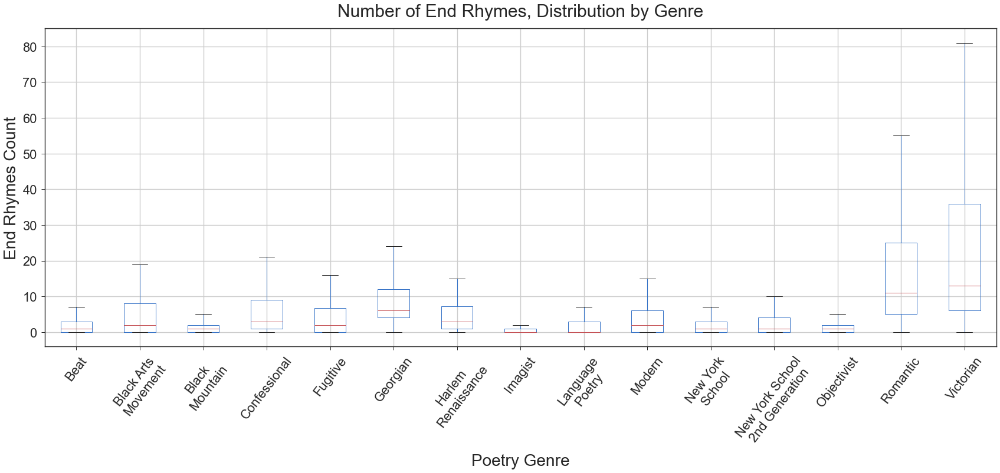

In [40]:
# plot the graph
df.boxplot('num_end_rhymes', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Number of End Rhymes, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('End Rhymes Count', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Romantic and Victorian genres are far above the rest. Georgian poetry also looks fairly different .
### Let's see if the ratio of end rhymes to number of lines provides any more insight

In [41]:
# create column of the ratio of end rhymes to the total lines
df['end_rhyme_ratio'] = df.num_end_rhymes / df.num_lines

In [42]:
# end rhyme ratio stats as a whole
df.end_rhyme_ratio.describe()

count    4626.000000
mean        0.287813
std         0.542488
min         0.000000
25%         0.000000
50%         0.125000
75%         0.384615
max        13.846154
Name: end_rhyme_ratio, dtype: float64

In [43]:
# end rhyme ratio stats by genre
df.groupby('genre').end_rhyme_ratio.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,0.111400,0.169917,0.070387,0.286760,0.207509,0.414954,0.270924,0.057574,0.062706,0.210880,0.068373,0.118893,0.052300,0.598382,0.783333
std,0.414644,0.308607,0.100100,0.790383,0.274450,0.332224,0.266837,0.131976,0.119465,0.263735,0.107944,0.285415,0.090645,0.631102,0.979743
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.033675,0.000000,0.250000,0.103947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285714,0.346875
50%,0.037037,0.057971,0.037037,0.121324,0.091667,0.355042,0.226496,0.000000,0.000000,0.136364,0.038462,0.050000,0.020408,0.477227,0.500000
75%,0.103807,0.195652,0.100000,0.316842,0.288750,0.536401,0.380952,0.056373,0.087276,0.322479,0.088235,0.132234,0.070197,0.706250,0.874313
max,4.800000,2.790698,0.600000,9.700000,1.322981,2.344828,1.918605,1.181818,0.866667,3.704132,0.919060,2.842105,0.733333,6.116006,13.846154


### End rhyme ratio -- Boxplot

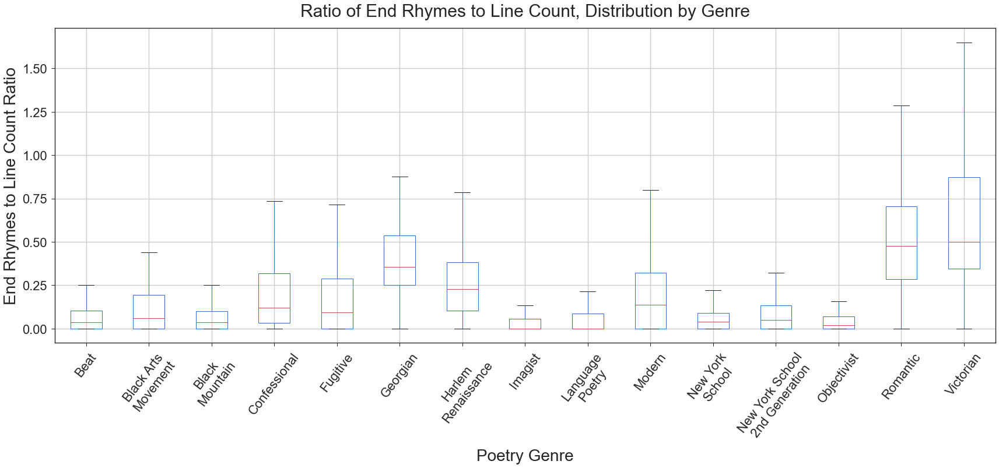

In [44]:
# plot the graph
df.boxplot('end_rhyme_ratio', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Ratio of End Rhymes to Line Count, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('End Rhymes to Line Count Ratio', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### This plot does seem to show the differences more clearly. Romantic and Victorian still in a strong lead, while Georgian and Harlem Renaissance are more clearly more end rhyme-y than the rest.
#### Modern makes a surprise appearance. Everything else makes sense from a poetry standpoint.
### Let's take another, more categorical look -- Usage of End Rhymes Across Genres
#### Feel free to play around with the metric; first I tried separating based on 0 end rhymes vs any number of end rhymes. Increasing the 0 value yielded more interesting results (weeds out some incidental end rhymes). Another tactic is setting a minimum ratio of end rhymes to lines, as seen below.

In [45]:
# create a yes or no column for whether or not end rhymes occur at least 25% of the time
df['end_rhyme'] = np.where(df.end_rhyme_ratio >= 0.25, 1, 0)

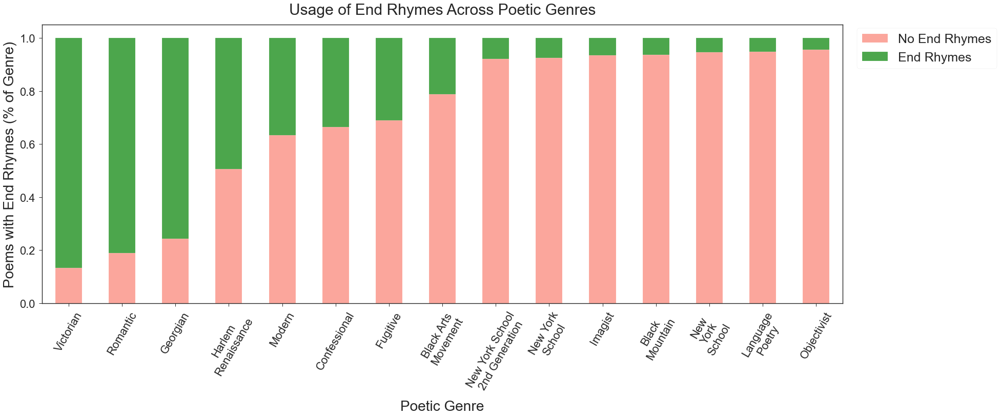

In [46]:
# Proportion of end rhymes across genres
genre_polarity_dist = df.groupby('genre').end_rhyme.value_counts(normalize=True).unstack().sort_values(0)

# plot the graph
genre_polarity_dist.plot(kind='bar', stacked = True, figsize=(28,10), 
                               color = ['salmon', 'green'], alpha = .70, fontsize=14)

# prettify the graph
plt.title('Usage of End Rhymes Across Poetic Genres', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetic Genre', fontsize=28, labelpad=10)
plt.ylabel('Poems with End Rhymes (% of Genre)', fontsize=28, labelpad=5)

# obtain x-tick-labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[-8] = 'Black Arts\nMovement'
labels_pretty[-6] = 'New York\nSchool'
labels_pretty[-7] = 'New York School\n2nd Generation'

# plot the labels and and legends
plt.xticks(ticks=locs, labels=labels_pretty, rotation=60, fontsize=22)
plt.yticks(fontsize=22);
plt.legend(['No End Rhymes', 'End Rhymes'], facecolor='white', framealpha=1, bbox_to_anchor=(1.01, 1.01),
          fontsize=25);

## Syllable counting
#### Count the number of total syllables and the average number of syllables per line

In [47]:
# create column using custom function to count a poem's total syllables
df['num_syllables'] = df.clean_lines.apply(syllable_counter)

In [48]:
# total number of syllables stats as a whole
df.num_syllables.describe()

count    4626.000000
mean      277.675962
std       510.047153
min         2.000000
25%        99.000000
50%       150.000000
75%       256.000000
max      8539.000000
Name: num_syllables, dtype: float64

In [49]:
# total number of syllables stats by genre
df.groupby('genre').num_syllables.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,413.843537,314.454545,181.583658,319.085227,238.622222,193.631250,171.324324,160.747191,242.442708,181.956216,309.625000,317.713542,226.339623,451.125628,460.956454
std,882.084430,265.819659,222.618547,516.268223,340.471470,175.242962,238.568669,214.528866,304.172789,264.836699,431.668555,413.089973,324.266901,846.946921,816.980066
min,16.000000,24.000000,9.000000,25.000000,40.000000,12.000000,7.000000,8.000000,13.000000,6.000000,33.000000,2.000000,17.000000,22.000000,19.000000
25%,119.000000,143.000000,80.000000,134.250000,132.000000,100.000000,70.750000,66.500000,81.750000,88.000000,152.750000,106.500000,73.000000,124.250000,127.500000
50%,187.000000,230.000000,123.000000,191.000000,179.000000,139.000000,120.000000,106.500000,139.000000,132.000000,211.000000,182.000000,116.000000,173.000000,196.000000
75%,375.000000,403.000000,187.000000,297.500000,229.500000,223.000000,165.750000,163.000000,290.500000,191.000000,305.250000,326.750000,226.500000,382.500000,420.500000
max,8539.000000,1638.000000,1911.000000,4464.000000,3027.000000,1546.000000,1997.000000,1867.000000,2958.000000,5058.000000,5497.000000,3065.000000,2536.000000,6750.000000,8236.000000


### Total syllables -- Boxplot

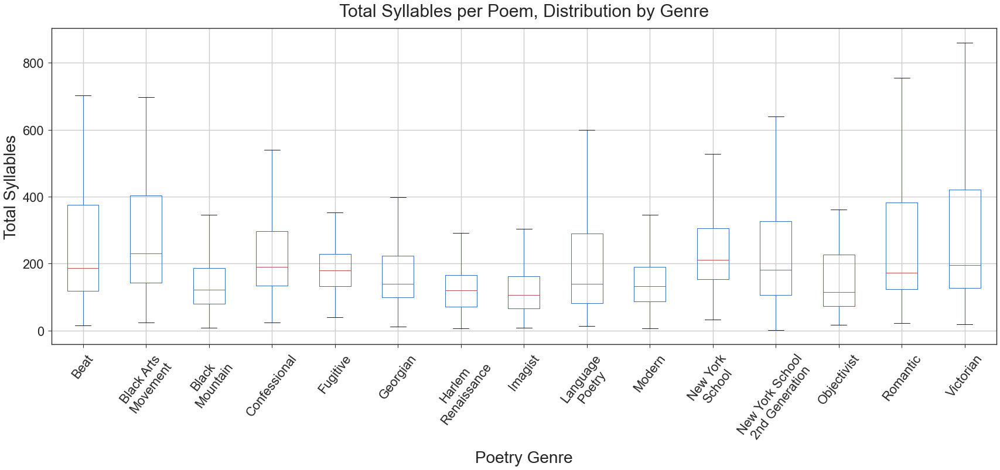

In [50]:
# plot the graph
df.boxplot('num_syllables', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Total Syllables per Poem, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Total Syllables', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()

# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Unsurprisingly this looks familar. Number of syllables is highly related to number of words.

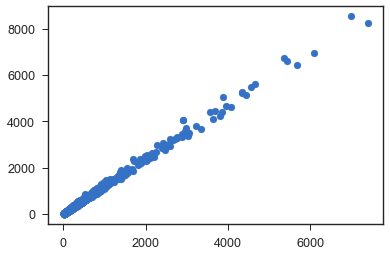

In [51]:
plt.scatter(df.num_words, df.num_syllables)

#### Find the average number of syllables per line

In [52]:
# divide number of syllables by number of words
df['avg_syllables_word'] = df.num_syllables / df.num_words

In [53]:
# average syllables per word stats as a whole
df.avg_syllables_word.describe()

count    4626.000000
mean        1.209394
std         0.088398
min         1.000000
25%         1.151261
50%         1.200000
75%         1.256098
max         2.064516
Name: avg_syllables_word, dtype: float64

In [54]:
# average syllables per word stats by genre
df.groupby('genre').avg_syllables_word.describe().T

genre,beat,black_arts_movement,black_mountain,confessional,fugitive,georgian,harlem_renaissance,imagist,language_poetry,modern,new_york_school,new_york_school_2nd_generation,objectivist,romantic,victorian
count,147.000000,165.000000,257.000000,176.000000,90.000000,160.000000,148.000000,356.000000,192.000000,1279.000000,264.000000,192.000000,159.000000,398.000000,643.000000
mean,1.251044,1.256582,1.220585,1.203155,1.201024,1.184383,1.184591,1.208123,1.272800,1.207070,1.262727,1.280211,1.224878,1.179285,1.156257
std,0.090092,0.098798,0.081282,0.060536,0.119902,0.059215,0.082310,0.092306,0.100644,0.085424,0.084788,0.103490,0.079331,0.058189,0.056677
min,1.069767,1.000000,1.029412,1.000000,1.069149,1.044118,1.023438,1.000000,1.000000,1.000000,1.046875,1.000000,1.034483,1.034247,1.000000
25%,1.194838,1.182796,1.170940,1.163147,1.136859,1.148009,1.126078,1.151465,1.216895,1.152721,1.211149,1.214548,1.168464,1.137826,1.117798
50%,1.235294,1.243478,1.213115,1.202848,1.187135,1.178891,1.179175,1.196952,1.268468,1.200000,1.252099,1.270555,1.227273,1.178774,1.153061
75%,1.289223,1.318885,1.269663,1.238988,1.229178,1.221202,1.229121,1.252033,1.336424,1.250000,1.300458,1.338462,1.265725,1.212968,1.187453
max,1.573705,1.595506,1.465909,1.416667,2.064516,1.345865,1.419355,1.607143,1.583333,1.650391,1.685484,1.733333,1.500000,1.409091,1.486486


### Syllables per word -- Boxplot

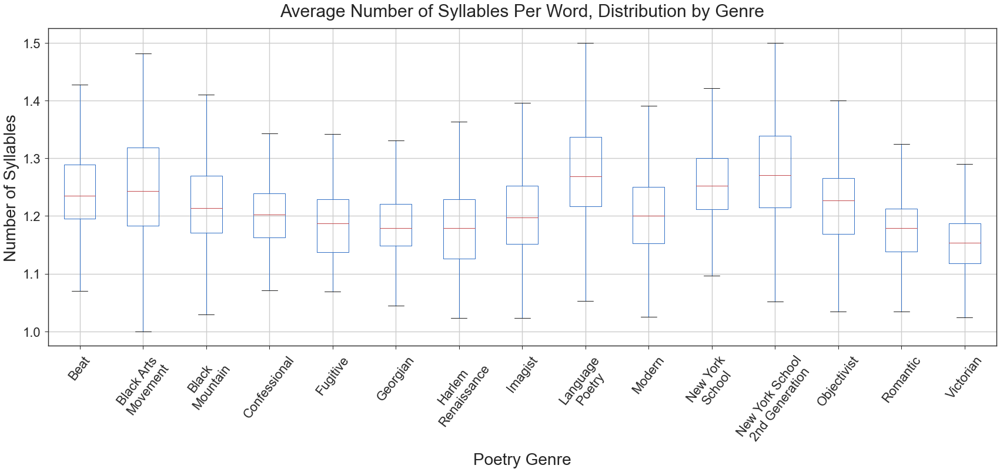

In [55]:
# plot the graph
df.boxplot('avg_syllables_word', 'genre', showfliers=False, figsize=(28,10))

# prettify the graph
plt.title('Average Number of Syllables Per Word, Distribution by Genre', fontsize=30, pad=20)
plt.suptitle('')
plt.xlabel('Poetry Genre', fontsize=28, labelpad=10)
plt.ylabel('Number of Syllables', fontsize=28, labelpad=5)

# obtain x-tick labels and their locations
locs, labels = plt.xticks()
# prettify the labels
labels_pretty = [label.get_text().replace('_', '\n').title() for label in list(labels)]
labels_pretty[1] = 'Black Arts\nMovement'
labels_pretty[-5] = 'New York\nSchool'
labels_pretty[-4] = 'New York School\n2nd Generation'

# plot the labels
plt.xticks(ticks=locs, labels=labels_pretty, rotation=52.5, fontsize=22)
plt.yticks(fontsize=22);

#### Surprisingly, in my mind at least, Romantic and Victorian are among the simplest vocabularies (words with the least amount of syllables.
#### Unsurprisingly, the more intellectual, avant-garde genres like Language Poetry, NY School 2nd Gen, and Black Arts Movement rank among the most complex.

## Text Processing
#### Let's process the text and look at our most frequent words
#### Since I'll be treating the title as part of the poem, combine title and lines

In [56]:
# NOTE: a pesky float ValueError solved by casting str() on values, even though it seems like everything was a string already
df['lines_titled'] = df['title'].apply(lambda x: [str(x)]) + df['clean_lines']
df.loc[2,'lines_titled']

['December 30',
 'At 1:03 in the morning a fart',
 'smells like a marriage between',
 'an avocado and a fish head.',
 'I have to get out of bed',
 'to write this down without',
 'my glasses on.']

In [57]:
# turn each titled poem into a string
df['string_titled'] = df.lines_titled.apply(lambda x: ' '.join(x))
df.loc[2,'string_titled']

'December 30 At 1:03 in the morning a fart smells like a marriage between an avocado and a fish head. I have to get out of bed to write this down without my glasses on.'

#### Prepare a list of stop words

In [58]:
# prepare a list of poet names to add to stop words list, because some may have gotten through in the scraping step
# first prepare a list of names that may also be used as words, so that we DON'T include them in the stop_names list
name_keeps = ['basil', 'bell', 'bill', 'bottoms', 'brooks', 'brown', 'burns', 'butler', 'christian', 'clerk', 'crane',
              'elephant', 'field', 'gallup', 'good', 'guest', 'hands', 'hood', 'hooks', 'hunt', 'hunter', 'knight',
              'lamb', 'lazarus', 'love', 'mare', 'more', 'mark', 'moody', 'peacock', 'pound', 'ransom', 'riding',
              'savage', 'sir', 'white']
# optional = ['bob', 'dick', 'lee', 'maya', 'sappho', 'sexton', 'smith', 'spender', 'twain', 'walker']

stop_names = set()
for poet in df.poet:
    name_split = poet.lower().split()
    for name in name_split:
        if name not in name_keeps:
            stop_names.add(name)
stop_names = list(stop_names)
stop_names[:10]

['paul',
 'wilfred',
 'bai',
 'hughes',
 'k.',
 'violi',
 'waring',
 'cummings',
 'james',
 'du']

In [59]:
# start with NLTK stop words
stop_words = stopwords.words('english')

# add any html tags that may have snuck through
stop_words.extend(['em','div', 'href', 'p'])

# add old-timey stop words (modified from Bryan Bumgardner's: https://bryanbumgardner.com/elizabethan-stop-words-for-nlp/)
stop_words.extend(['doth', 'dost', 'ere', 'hast', 'hath', 'hence', 'hither', 'nigh', 'oft', "should'st", 'thither',
                   'tither', 'thee', 'thou', 'thine', 'thy', 'tis', 'twas', 'wast', 'whence', 'wherefore', 'whereto', 
                   'withal', "would'st", 'ye', 'yon', 'yonder'])

# let's include some words found in the initial round of EDA that probably don't give us much meaning
stop_words.extend(['like', 'would', 'shall', 'upon', 'yet', 'may', 'could'])

# and don't forget to include the names from above
stop_words.extend(stop_names)

#### Create a clean string column

In [60]:
# create column using custom text processing function
# NOTE: includes lemmatization
df['string_cleaned'] = df.string_titled.apply(lambda x: clean_text(x, stop_words))

In [61]:
# check out an example
print(f"BEFORE:\n{df.iloc[2,-2]}")
print('\n' + '-' * 100 + '\n')
print(f"AFTER:\n{df.iloc[2,-1]}")

BEFORE:
December 30 At 1:03 in the morning a fart smells like a marriage between an avocado and a fish head. I have to get out of bed to write this down without my glasses on.

----------------------------------------------------------------------------------------------------

AFTER:
december morning fart smell marriage avocado fish head get bed write without glass


In [62]:
# check out another example
print(f"BEFORE:\n{df.iloc[4444,-2]}\n")
print('-' * 100)
print(f"\nAFTER:\n{df.iloc[4444,-1]}")

BEFORE:
When I am dead, my dearest When I am dead, my dearest, Sing no sad songs for me; Plant thou no roses at my head, Nor shady cypress tree: Be the green grass above me With showers and dewdrops wet; And if thou wilt, remember, And if thou wilt, forget. I shall not see the shadows, I shall not feel the rain; I shall not hear the nightingale Sing on, as if in pain: And dreaming through the twilight That doth not rise nor set, Haply I may remember, And haply may forget.

----------------------------------------------------------------------------------------------------

AFTER:
dead dearest dead dearest sing sad song plant rose head shady cypress tree green grass shower dewdrop wet wilt remember wilt forget see shadow feel rain hear nightingale sing pain dream twilight rise set haply remember haply forget


### Total word count, vocabulary, and most frequent words
#### Let's see how many words and unique words we have in the dataset (before processing the text)

In [63]:
# join all pre-processed poems into one string
big_string = ' '.join(df.string_titled)
big_string[:1000]

'At the California Institute of Technology I don’t care how God-damn smart these guys are: I’m bored. It’s been raining like hell all day long and there’s nothing to do. A Boat O beautiful was the werewolf in his evil forest. We took him to the carnival and he started crying when he saw the Ferris wheel. Electric green and red tears flowed down his furry cheeks. He looked like a boat out on the dark water. December 30 At 1:03 in the morning a fart smells like a marriage between an avocado and a fish head. I have to get out of bed to write this down without my glasses on. The Double-Bed Dream Gallows Driving through hot brushy country in the late autumn, I saw a hawk crucified on a barbed-wire fence. I guess as a kind of advertisement to other hawks, saying from the pages of a leading women’s magazine, “She’s beautiful, but burn all the maps to your body. I’m not here of my own choosing.” Haiku Ambulance A piece of green pepper fell off the wooden salad bowl: so what? I Feel Horrible. S

In [64]:
# split string into all words in corpus
all_words = big_string.split()

# total words
len(all_words)

1079536

In [65]:
# unique words (vocabulary)
len(list(set(all_words)))

113933

#### Now let's do the same on our cleaned text (after lemmatizing and removing stop words)

In [66]:
# join all processed poems into one string
big_string2 = ' '.join(df.string_cleaned)
big_string2[:1000]

'california institute technology care god damn smart guy bore rain hell day long nothing boat beautiful werewolf evil forest take carnival start cry saw ferris wheel electric green red tear flow furry cheek look boat dark water december morning fart smell marriage avocado fish head get bed write without glass double bed dream gallows drive hot brushy country late autumn saw hawk crucify barbed wire fence guess kind advertisement hawk say page lead woman magazine beautiful burn map body choose haiku ambulance piece green pepper fell wooden salad bowl feel horrible feel horrible love wander around house sew machine finish sew turd garbage lid mating saliva girl green mini skirt pretty walk street businessman stop turn stare look moldy refrigerator people america pill versus springhill mine disaster take pill mine disaster think people lose inside poker star star look poker game mountain eastern oregon three men play sheepherder one two pair others nothing private eye lettuce three crate 

In [67]:
# split string into all words in corpus
all_words2 = big_string2.split()

# total words
len(all_words2)

547259

In [68]:
# unique words (vocabulary)
len(list(set(all_words2)))

33680

#### Look at most frequent words

In [69]:
# create dictionary of word counts
fdist = FreqDist(all_words2)
fdist

FreqDist({'one': 3713, 'love': 3084, 'come': 3042, 'say': 2658, 'day': 2445, 'see': 2392, 'make': 2366, 'eye': 2205, 'know': 2105, 'life': 2065, ...})

In [70]:
# convert word counts to dataframe
fdist_df = pd.DataFrame(data=fdist.values(), index=fdist.keys(), columns=['word_count'])
fdist_df = fdist_df.sort_values('word_count', ascending=False)

In [71]:
# look at the top 25 words in the processed corpus
top_25 = fdist_df.iloc[:25,:]
top_25

,word_count
one,3713
love,3084
come,3042
say,2658
day,2445
see,2392
make,2366
eye,2205
know,2105
life,2065


### Most frequent words -- Bar chart

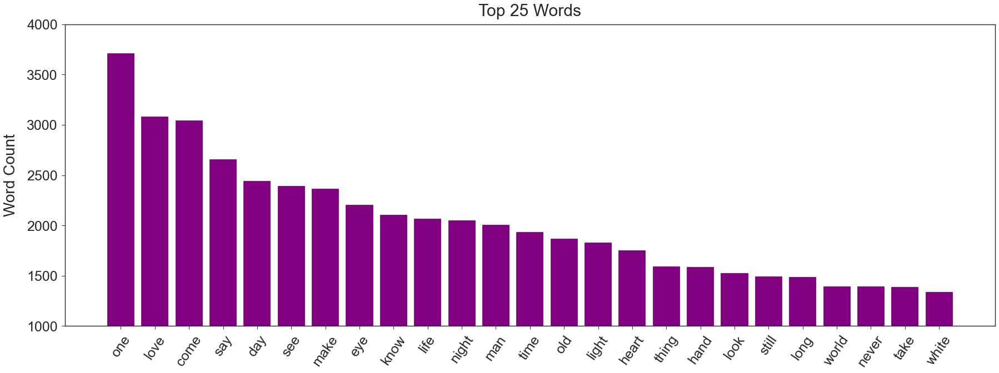

In [72]:
# create labels and prettify the plot
plt.figure(figsize=(30,10))
plt.title('Top 25 Words', fontsize=30, pad=15)
plt.ylabel('Word Count', fontsize=28, labelpad=15)
plt.xticks(rotation=55, fontsize=25)
plt.yticks(fontsize=25)
plt.ylim(bottom=1000, top=4000)

# plot top 25 words
plt.bar(top_25.index, top_25.word_count, color='purple');

# plt.savefig('charts/top_25_words.png', dpi = 100)

### Word clouds

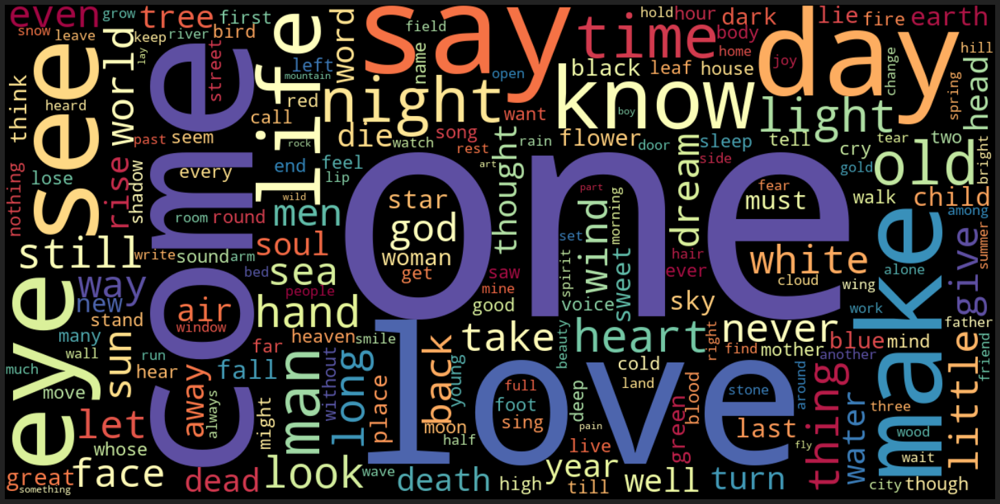

In [73]:
# create a dictionary for easy word cloud creation
word_dict = dict(Counter(all_words2))

# create word cloud
wordcloud = WordCloud(colormap='Spectral', width=1200, height=600).generate_from_frequencies(word_dict)

# plot word cloud
plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

In [74]:
def display_wordcloud(top_words, title, n_components):
    plt.figure()
    j = np.ceil(n_components/4)
    for t in range(n_components):
        i=t+1
        plt.subplot(j, 4, i).set_title("Topic #" + str(t))
        plt.plot()
        plt.imshow(WordCloud().fit_words(top_words[t]))
        plt.axis("off")
    fig.suptitle(title)
    plt.show()

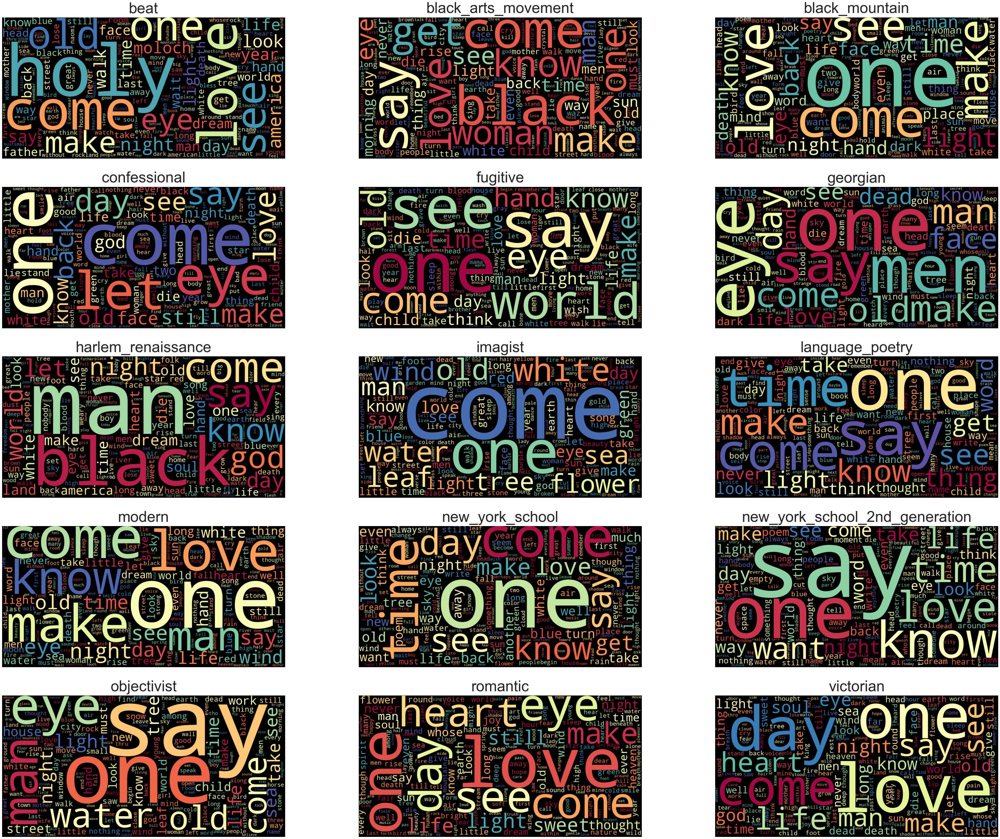

In [75]:
plt.figure(figsize=(60,50))

genres = list(df.genre.unique())

for i, genre in enumerate(genres):
    # create a series of processed poem strings
    genre_string_series = df[df.genre == genre].string_cleaned
    
    # convert the series to one big string
    genre_big_string = ' '.join(genre_string_series)
    
    # split the big string so we get all words in the genre
    genre_words = genre_big_string.split()
    
    # create a dictionary for easy word cloud creation
    genre_word_dict = dict(Counter(genre_words))

    # create word cloud
    genre_wordcloud = WordCloud(colormap='Spectral', width=1200, height=600).\
                                                        generate_from_frequencies(genre_word_dict)

    nrows = 5
    ncols = 3
    
#     plt.figure(figsize=(60,50), facecolor='k')
    plt.subplot(nrows, ncols, i+1).set_title(f'{genre}')
    plt.plot()
    plt.imshow(genre_wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{genre}', fontsize=50, pad=15)
    
#     plt.subplot()
#     # plot word cloud
# #     axes[i].figure(figsize=(20,10), facecolor='k')
#     axes[i].imshow(genre_wordcloud, interpolation='bilinear')
#     axes[i].set_title(f'{genre}')
#     axes[i].axis("off")
#     axes[i].tight_layout(pad=0)

## SAVE/LOAD -- Numerical features DataFrame
#### NOTE: I'll be pickling now to avoid having to destringify columns

In [77]:
# uncomment to save
with gzip.open('/Users/p.szymo/Documents/flatiron/projects/mod5/poetry_genre_classifier/data/poetry_all_genres_df.pkl', 'wb') as goodbye:
    pickle.dump(df, goodbye, protocol=pickle.HIGHEST_PROTOCOL)
    
# uncomment to load
with gzip.open('/Users/p.szymo/Documents/flatiron/projects/mod5/poetry_genre_classifier/data/poetry_all_genres_df.pkl', 'rb') as hello:
    df = pickle.load(hello)

In [78]:
df.columns

Index(['poet_url', 'genre', 'poem_url', 'poet', 'title', 'poem_lines',
       'poem_string', 'clean_lines', 'num_lines', 'num_words', 'avg_len_line',
       'sentiment_polarity_score', 'sentiment_polarity',
       'sentiment_subjectivity_score', 'num_end_rhymes', 'end_rhyme_ratio',
       'end_rhyme', 'num_syllables', 'avg_syllables_word', 'lines_titled',
       'string_titled', 'string_cleaned'],
      dtype='object')

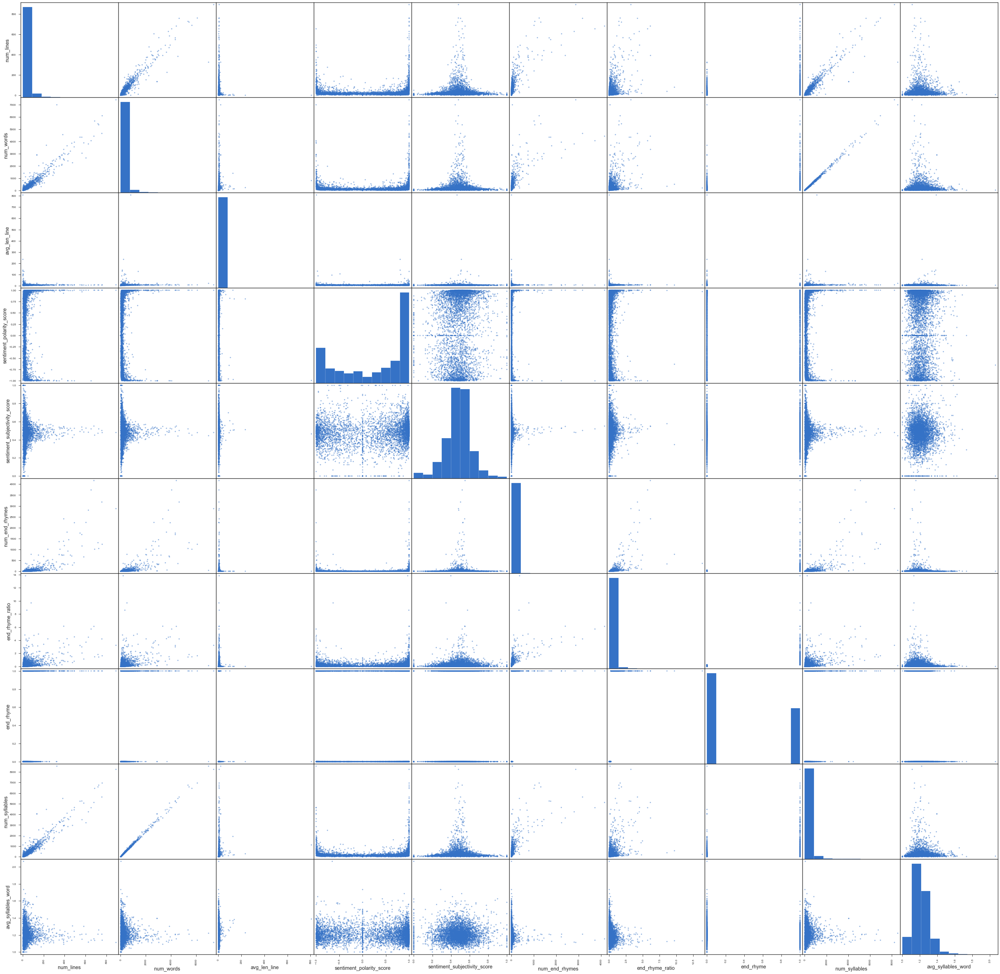

In [79]:
pd.plotting.scatter_matrix(df[['num_lines', 'num_words', 'avg_len_line', 'sentiment_polarity_score',
                               'sentiment_polarity', 'sentiment_subjectivity_score', 'num_end_rhymes', 
                               'end_rhyme_ratio', 'end_rhyme', 'num_syllables', 'avg_syllables_word']], 
                           figsize=(50,50));

## Modeling Prep
### Removing outliers/capping values so they don't throw off our scaler
#### Number of lines

In [80]:
df_edit = df.copy()

In [81]:
df_edit.num_lines.describe()

count    4626.000000
mean       34.931907
std        57.182007
min         1.000000
25%        14.000000
50%        21.000000
75%        31.000000
max       892.000000
Name: num_lines, dtype: float64

In [82]:
df_edit[df_edit.num_lines < 90].num_lines

0        4
1       17
2        6
3       17
4        4
        ..
4618    72
4619    42
4622    56
4623    44
4624    40
Name: num_lines, Length: 4335, dtype: int64

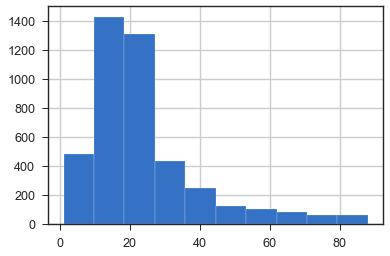

In [83]:
df_edit[df_edit.num_lines < 90].num_lines.hist()

In [84]:
df_edit['num_lines'] = np.where(df_edit.num_lines > 90, 90, df_edit.num_lines)

#### Number of words

In [85]:
df.num_words.describe()

count    4626.000000
mean      229.970817
std       427.390008
min         2.000000
25%        83.000000
50%       124.000000
75%       208.750000
max      7405.000000
Name: num_words, dtype: float64

In [86]:
df[df.num_words < 700].num_words

0        24
1        45
2        33
3        54
4        13
       ... 
4619    394
4620    671
4622    393
4623    279
4624    230
Name: num_words, Length: 4392, dtype: int64

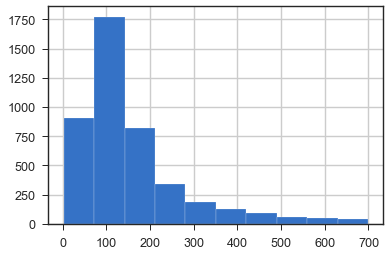

In [87]:
df[df.num_words < 700].num_words.hist()

In [88]:
df_edit['num_words'] = np.where(df_edit.num_words > 700, 700, df_edit.num_words)

#### Average words per line

In [89]:
df[df.avg_len_line < 12].avg_len_line

0       6.000000
1       2.647059
2       5.500000
3       3.176471
4       3.250000
          ...   
4621    6.153236
4622    7.017857
4623    6.340909
4624    5.750000
4625    6.214067
Name: avg_len_line, Length: 4544, dtype: float64

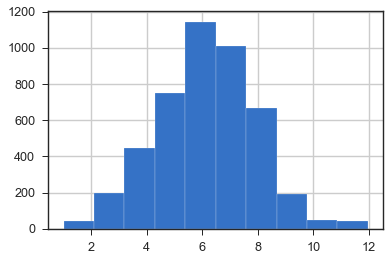

In [90]:
df[df.avg_len_line < 12].avg_len_line.hist()

In [91]:
df_edit['avg_len_line'] = np.where(df_edit.avg_len_line > 12, 12, df_edit.avg_len_line)

#### Number of end rhymes

In [92]:
df_edit.num_end_rhymes.describe()

count    4626.000000
mean       23.130350
std       153.972345
min         0.000000
25%         0.000000
50%         3.000000
75%         9.000000
max      4165.000000
Name: num_end_rhymes, dtype: float64

In [93]:
df_edit[df_edit.num_end_rhymes < 50].num_end_rhymes

0        0
1        0
2        1
3        0
4        0
        ..
4617     9
4619    26
4622    36
4623    18
4624    17
Name: num_end_rhymes, Length: 4362, dtype: int64

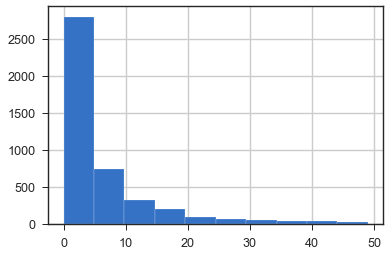

In [94]:
df_edit[df_edit.num_end_rhymes < 50].num_end_rhymes.hist()

In [95]:
df_edit['num_end_rhymes'] = np.where(df_edit.num_end_rhymes > 50, 50, df_edit.num_end_rhymes)

#### End rhyme ratio

In [96]:
df_edit.end_rhyme_ratio.describe()

count    4626.000000
mean        0.287813
std         0.542488
min         0.000000
25%         0.000000
50%         0.125000
75%         0.384615
max        13.846154
Name: end_rhyme_ratio, dtype: float64

In [97]:
df_edit[df_edit.end_rhyme_ratio < 1].end_rhyme_ratio

0       0.000000
1       0.000000
2       0.166667
3       0.000000
4       0.000000
          ...   
4618    0.708333
4619    0.619048
4622    0.642857
4623    0.409091
4624    0.425000
Name: end_rhyme_ratio, Length: 4380, dtype: float64

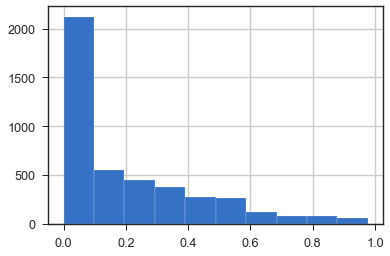

In [98]:
df_edit[df_edit.end_rhyme_ratio < 1].end_rhyme_ratio.hist()

In [99]:
df_edit['end_rhyme_ratio'] = np.where(df_edit.end_rhyme_ratio > 50, 50, df_edit.end_rhyme_ratio)

## SAVE/LOAD -- EDITED Numerical features DataFrame

In [100]:
# uncomment to save
with gzip.open('/Users/p.szymo/Documents/flatiron/projects/mod5/poetry_genre_classifier/data/poetry_all_genres_df_edit.pkl', 'wb') as goodbye:
    pickle.dump(df_edit, goodbye, protocol=pickle.HIGHEST_PROTOCOL)
    
# # uncomment to load
# with gzip.open('data/poetry_all_genres_df_edit.pkl', 'rb') as hello:
#     df = pickle.load(hello)


#### Let's separate our target variable and create a features dataframe 

In [ ]:
target = df['genre']
features = df[['title', 'clean_lines', 'num_lines', 'avg_len_line', 'sentiment_polarity_score', 'sentiment_polarity',
               'sentiment_subjectivity_score', 'num_end_rhymes', 'end_rhyme_ratio']]

#### Now we can drop the title and clean_lines columns

In [ ]:
features.drop(columns=['title', 'clean_lines'], inplace=True)
features.columns

#### Prepare a list of stop words

In [ ]:
# prepare a list of poet names to add to stop words list, because some may have gotten through in the scraping step
# first prepare a list of names that may also be used as words
name_keeps = ['basil', 'bell', 'bill', 'bottoms', 'brooks', 'brown', 'burns', 'butler', 'christian', 'clerk', 'crane',
              'elephant', 'field', 'gallup', 'good', 'guest', 'hands', 'hood', 'hooks', 'hunt', 'hunter', 'knight',
              'lamb', 'lazarus', 'love', 'mare', 'more', 'mark', 'moody', 'peacock', 'pound', 'ransom', 'riding',
              'savage', 'sir', 'white']
# optional = ['bob', 'dick', 'lee', 'maya', 'sappho', 'sexton', 'smith', 'spender', 'twain', 'walker']

stop_names = set()
for poet in df.poet:
    name_split = poet.lower().split()
    for name in name_split:
        if name not in name_keeps:
            stop_names.add(name)
stop_names = list(stop_names)
stop_names[:10]

In [ ]:
# start with NLTK stop words
stop_words = stopwords.words('english')
# add any html tags that may have snuck through
stop_words.extend(['em','div', 'href', 'p'])
# add old-timey stop words (modified from Bryan Bumgardner's: https://bryanbumgardner.com/elizabethan-stop-words-for-nlp/)
stop_words.extend(['doth', 'dost', 'ere', 'hast', 'hath', 'hence', 'hither', 'nigh', 'oft', "should'st", 'thither',
                   'tither', 'thee', 'thou', 'thine', 'thy', 'tis', 'twas', 'wast', 'whence', 'wherefore', 'whereto', 
                   'withal', "would'st", 'ye', 'yon', 'yonder'])
# let's include some words found in the initial round of EDA that probably don't give us much meaning
stop_words.extend(['like', 'would', 'shall', 'upon', 'yet', 'may', 'could'])
# and don't forget to include the names from above
stop_words.extend(stop_names)

#### Create a clean string column

In [ ]:
features['string_cleaned'] = features.string_titled.apply(lambda x: clean_text(x, stop_words))

In [ ]:
features.iloc[2]

In [ ]:
# check out an example
print(f"BEFORE:\n{features.iloc[2,8]}")
print('\n' + '-' * 100 + '\n')
print(f"AFTER:\n{features.iloc[2,9]}")

In [ ]:
# check out an example
print(f"BEFORE:\n{features.iloc[4444,8]}\n")
print('-' * 100)
print(f"\nAFTER:\n{features.iloc[4444,9]}")

## SAVE/LOAD
#### both target series and features dataframe

In [ ]:
# # SAVE
# # uncomment to save target series
# with gzip.open('data/target_genres.pkl', 'wb') as goodbye1:
#     pickle.dump(target, goodbye1, protocol=pickle.HIGHEST_PROTOCOL)
# # uncomment to save features dataframe
# with gzip.open('data/features.pkl', 'wb') as goodbye2:
#     pickle.dump(features, goodbye2, protocol=pickle.HIGHEST_PROTOCOL)

# # LOAD
# # uncomment to load target series
# with gzip.open('data/target_genres.pkl', 'rb') as hello1:
#     target = pickle.load(hello1)
# # uncomment to load features dataframe
# with gzip.open('data/features.pkl', 'rb') as hello2:
#     features = pickle.load(hello2)